In [343]:
from sklearn.cluster import KMeans
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from matplotlib import pyplot as plt
%matplotlib inline

In [344]:
df = pd.read_csv("dataset.csv")
df.head()

,Unnamed: 0,open,high,low,close,volume,marketCap,timestamp,crypto_name,date
0,0,112.900002,118.800003,107.142998,115.910004,0.0,1.288693e+09,2013-05-05T23:59:59.999Z,Bitcoin,2013-05-05
1,1,3.493130,3.692460,3.346060,3.590890,0.0,6.229819e+07,2013-05-05T23:59:59.999Z,Litecoin,2013-05-05
2,2,115.980003,124.663002,106.639999,112.300003,0.0,1.249023e+09,2013-05-06T23:59:59.999Z,Bitcoin,2013-05-06
3,3,3.594220,3.781020,3.116020,3.371250,0.0,5.859436e+07,2013-05-06T23:59:59.999Z,Litecoin,2013-05-06
4,4,112.250000,113.444000,97.699997,111.500000,0.0,1.240594e+09,2013-05-07T23:59:59.999Z,Bitcoin,2013-05-07


In [345]:
df = df[df.crypto_name != 'Litecoin']

In [346]:
df = df[df.volume != 0.0]

In [347]:
df.drop(['Unnamed: 0', 'low', 'close', 'high', 'marketCap', 'crypto_name', 'timestamp', 'date'], axis='columns', inplace=True)

In [348]:
# df.dropna(subset=['volume'])

In [349]:
df.head()

,open,volume
629,763.280029,46862700.0
631,0.000603,477422.0
632,0.024426,148422.0
633,0.027554,143404.0
634,0.000524,341581.0


In [350]:
km = KMeans(n_clusters=3)
y_predicted = km.fit_predict(df[['open','volume']])
y_predicted

array([0, 0, 0, ..., 0, 0, 0])

In [351]:
df['cluster']=y_predicted
df.head()

,open,volume,cluster
629,763.280029,46862700.0,0
631,0.000603,477422.0,0
632,0.024426,148422.0,0
633,0.027554,143404.0,0
634,0.000524,341581.0,0


In [352]:
df.cluster.unique()

array([0, 2, 1])

In [353]:
km.cluster_centers_

array([[5.55598689e+02, 7.54413183e+08],
       [7.25841357e+03, 9.61430477e+10],
       [1.13169786e+04, 3.30343668e+10]])

In [354]:
# scaler = MinMaxScaler()

# scaler.fit(df[['marketCap']])
# df['marketCap'] = scaler.transform(df[['marketCap']])

# scaler.fit(df[['open']])
# df['open'] = scaler.transform(df[['open']])

In [355]:
df.head()

,open,volume,cluster
629,763.280029,46862700.0,0
631,0.000603,477422.0,0
632,0.024426,148422.0,0
633,0.027554,143404.0,0
634,0.000524,341581.0,0


Text(0, 0.5, 'volume')

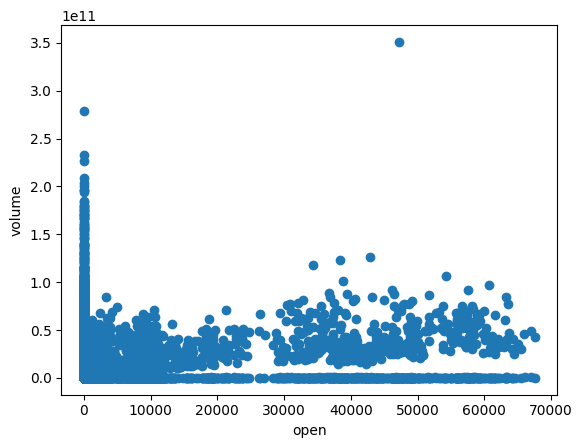

In [356]:
plt.scatter(df.open,df['volume'])
plt.xlabel('open')
plt.ylabel('volume')

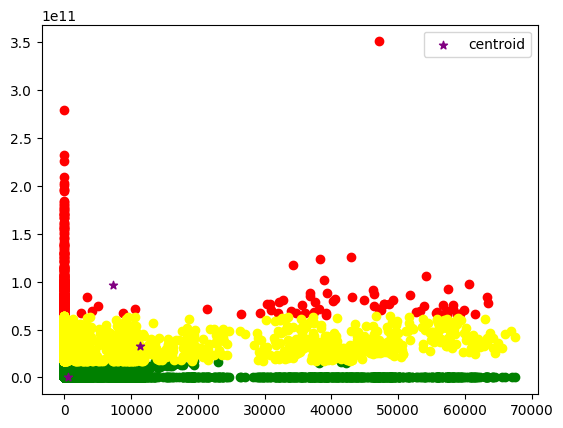

In [357]:
df1 = df[df.cluster==0]
df2 = df[df.cluster==1]
df3 = df[df.cluster==2]
plt.scatter(df1.open,df1['volume'],color='green')
plt.scatter(df2.open,df2['volume'],color='red')
plt.scatter(df3.open,df3['volume'],color='yellow')
plt.scatter(km.cluster_centers_[:,0],km.cluster_centers_[:,1],color='purple',marker='*',label='centroid')
plt.legend()